# EEG Artefacts, PCA and ICA

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import mne
from mne.preprocessing import ICA
import scipy.signal as signal
from sklearn.decomposition import PCA
from sklearn.decomposition import FastICA

### Implementing Singular Value Decomposition

In [2]:
def svd(X):
    n, m = X.shape
    X_center = X - np.mean(X, axis=0)
    covariance = np.dot(X_center.T, X_center) / (n-1)
    eigenvalues, eigenvectors = np.linalg.eig(covariance)
    idx = np.argsort(eigenvalues)[::-1]
    eigenvalues = eigenvalues[idx]
    eigenvectors = eigenvectors[:, idx]
    singular_values = np.sqrt(eigenvalues)
    U = np.dot(X_center, eigenvectors) / singular_values
    return U, singular_values, eigenvectors.T

### Implementing PCA using SVD

In [3]:
def pca_using_svd(X):
    U, S, V = svd(X)
    Z = np.dot(U, np.diag(S))
    return Z, V.T

### Implementing PCA using covariance matrix and eigen values

In [4]:
def pca_using_covmat(X):
    n, m = X.shape
    X_center = X - np.mean(X, axis=0)
    C = np.dot(X_center.T, X_center) / (n - 1)
    eigen_values, eigen_vectors = np.linalg.eig(C)
    eigen_pairs = [(np.abs(eigen_values[i]), eigen_vectors[:, i]) for i in range(m)]
    eigen_pairs.sort(key=lambda x: x[0], reverse=True)
    W = np.hstack([eigen_pairs[i][1].reshape(m, 1) for i in range(m)])
    Z = np.dot(X_center, W)
    return Z, W

In [5]:
def signal_to_noise_ratio(signal, noise):
    return 10 * np.log10(np.sum(signal ** 2) / np.sum(noise ** 2))

In [6]:
def signal_statics(signal):
    return np.mean(signal), np.std(signal)

In [7]:
def plot_components(Z, t):
    n, m = Z.shape
    plt.figure(figsize=(20, 10))
    for i in range(m):
        plt.plot(t, Z[:, i], label=f'Component {i + 1}')
    plt.xlabel('Time')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.show()

In [8]:
def plot_components_separately(S_,t):
    f,ax = plt.subplots(2,2,figsize=(20,10))
    ax[0,0].plot(t, S_[:,0], label='Component 1')
    ax[0,0].plot(t, S_[:,1], label='Component 2')
    ax[0,0].plot(t, S_[:,2], label='Component 3')
    ax[0,0].set_xlabel('Time (s)')
    ax[0,0].set_ylabel('Amplitude')
    ax[0,0].legend()
    ax[0,1].plot(t, S_[:,0], label='Component 1')
    ax[0,1].set_xlabel('Time (s)')
    ax[0,1].set_ylabel('Amplitude')
    ax[0,1].legend()
    ax[1,0].plot(t, S_[:,1], label='Component 2')
    ax[1,0].set_xlabel('Time (s)')
    ax[1,0].set_ylabel('Amplitude')
    ax[1,0].legend()
    ax[1,1].plot(t, S_[:,2], label='Component 3')
    ax[1,1].set_xlabel('Time (s)')
    ax[1,1].set_ylabel('Amplitude')
    ax[1,1].legend()

# PART - A

#### Generating Signals

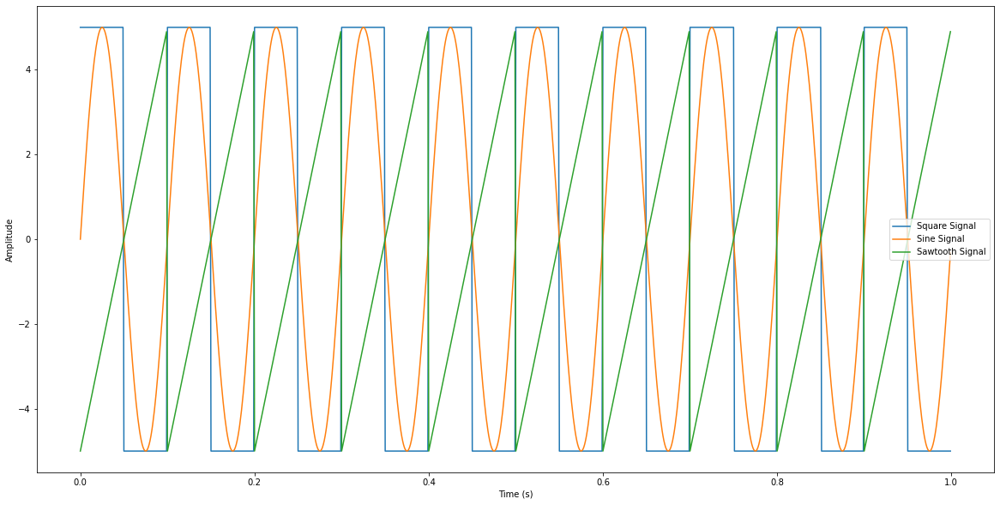

In [9]:
fs = 1000
t = np.arange(0,1, 1/fs)

square_signal = 5*signal.square(2 * np.pi * 10 * t)
sine_signal = 5*np.sin(2 * np.pi * 10 * t)
sawtooth_signal = 5*signal.sawtooth(2 * np.pi * 10 * t)

plt.figure(figsize=(20, 10))
plt.plot(t, square_signal, label='Square Signal')
plt.plot(t, sine_signal, label='Sine Signal')
plt.plot(t, sawtooth_signal, label='Sawtooth Signal')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.legend()
plt.show()

In [10]:
square_mean,square_var = signal_statics(square_signal)
print(f'Square Signal Mean: {square_mean}, Square Signal Variance: {square_var}')
sine_mean,sine_var = signal_statics(sine_signal)
print(f'Sine Signal Mean: {sine_mean}, Sine Signal Variance: {sine_var}')
sawtooth_mean,sawtooth_var = signal_statics(sawtooth_signal)
print(f'Sawtooth Signal Mean: {sawtooth_mean}, Sawtooth Signal Variance: {sawtooth_var}')

Square Signal Mean: 0.02, Square Signal Variance: 4.999959999839999
Sine Signal Mean: -3.410605131648481e-16, Sine Signal Variance: 3.5355339059327378
Sawtooth Signal Mean: -0.04999999999999892, Sawtooth Signal Variance: 2.8866070047722117


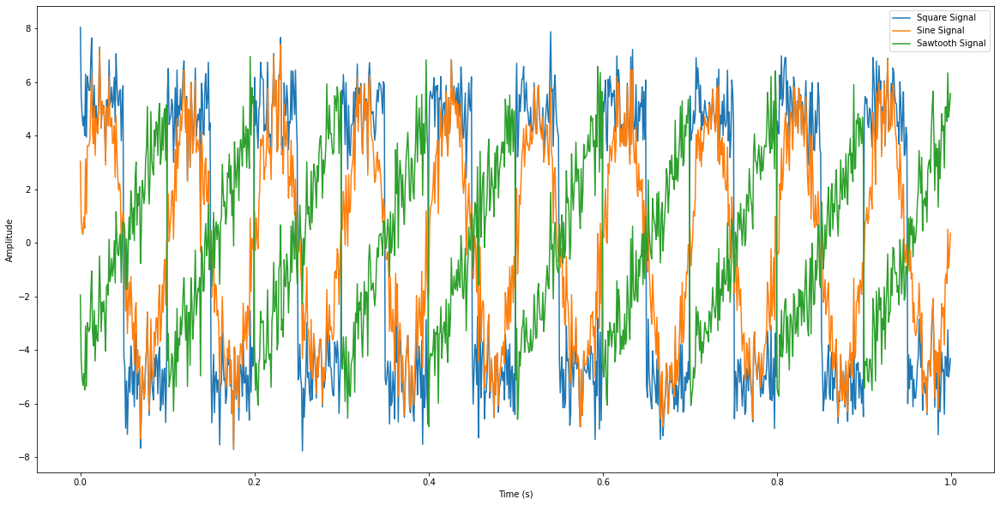

In [11]:
num_samples = len(t)

# Gaussian noise
noise = np.random.normal(0, 1, size=num_samples)

#uniform noise
#noise = np.random.uniform(-1, 1, size=num_samples)

# Adding noise to the sine signal
sine_signal_noise = sine_signal + noise
# Adding noise to the square signal
square_signal_noise = square_signal + noise
# Adding noise to the sawtooth signal
sawtooth_signal_noise = sawtooth_signal + noise

#ploting the signals
plt.figure(figsize=(20, 10))
plt.plot(t, square_signal_noise, label='Square Signal')
plt.plot(t, sine_signal_noise, label='Sine Signal')
plt.plot(t, sawtooth_signal_noise, label='Sawtooth Signal')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.legend()
plt.show()

In [12]:
square_mean,square_var = signal_statics(square_signal_noise)
print(f'Square + Noise Signal Mean: {square_mean}, Square +Noise Signal Variance: {square_var}')
print(f'SNR square +noise signal {signal_to_noise_ratio(square_signal, noise)}')
sine_mean,sine_var = signal_statics(sine_signal_noise)
print(f'Sine + Noise Signal Mean: {sine_mean}, Sine + Noise Signal Variance: {sine_var}')
print(f'SNR sine +noise signal {signal_to_noise_ratio(sine_signal, noise)}')
sawtooth_mean,sawtooth_var = signal_statics(sawtooth_signal_noise)
print(f'Sawtooth + Noise Signal Mean: {sawtooth_mean}, Sawtooth + Noise Signal Variance: {sawtooth_var}')
print(f'SNR sawtooth +noise signal {signal_to_noise_ratio(sawtooth_signal, noise)}')

Square + Noise Signal Mean: 0.008434898828661887, Square +Noise Signal Variance: 5.133783671558516
SNR square +noise signal 13.917062892609664
Sine + Noise Signal Mean: -0.011565101171338483, Sine + Noise Signal Variance: 3.6946765516646316
SNR sine +noise signal 10.906762935969853
Sawtooth + Noise Signal Mean: -0.06156510117133706, Sawtooth + Noise Signal Variance: 3.0167551969726873
SNR sawtooth +noise signal 9.14671884752953


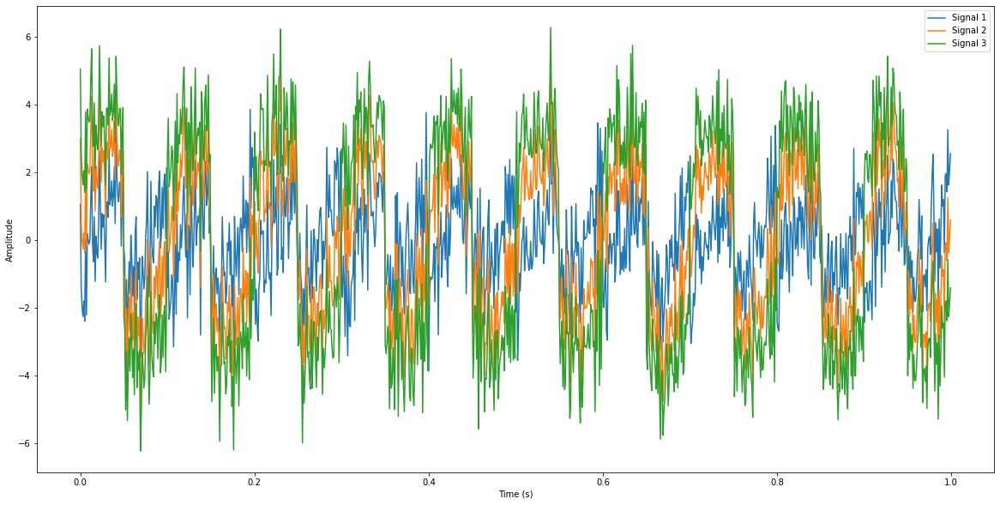

In [13]:
signal1 = 0.2*square_signal_noise + 0.2*sine_signal_noise + 0.6*sawtooth_signal_noise
signal2 = 0.33*square_signal_noise + 0.33*sine_signal_noise + 0.34*sawtooth_signal_noise
signal3 = 0.6*square_signal_noise + 0.2*sine_signal_noise + 0.2*sawtooth_signal_noise

# Ploting the signals
plt.figure(figsize=(20, 10))
plt.plot(t, signal1, label='Signal 1')
plt.plot(t, signal2, label='Signal 2')
plt.plot(t, signal3, label='Signal 3')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.legend()
plt.show()


In [14]:
signal1_mean,signal1_var = signal_statics(signal1)
print(f'Signal 1 Mean: {signal1_mean}, Signal 1 Variance: {signal1_var}')
print(f'SNR signal 1 {signal_to_noise_ratio(signal1, noise)}')
signal2_mean,signal2_var = signal_statics(signal2)
print(f'Signal 2 Mean: {signal2_mean}, Signal 2 Variance: {signal2_var}')
print(f'SNR signal 2 {signal_to_noise_ratio(signal2, noise)}')
signal3_mean,signal3_var = signal_statics(signal3)
print(f'Signal 3 Mean: {signal3_mean}, Signal 3 Variance: {signal3_var}')
print(f'SNR signal 3 {signal_to_noise_ratio(signal3, noise)}')

Signal 1 Mean: -0.03756510117133755, Signal 1 Variance: 1.3512419300620482
SNR signal 1 2.555680279001738
Signal 2 Mean: -0.02196510117133788, Signal 2 Variance: 2.2384707068005323
SNR signal 2 6.937109260329577
Signal 3 Mean: -0.009565101171338028, Signal 3 Variance: 3.348569517744902
SNR signal 3 10.434884631878468


In [15]:
signal1 = signal1/signal1_var
signal2 = signal2/signal2_var
signal3 = signal3/signal3_var

#### Applying PCA on signals

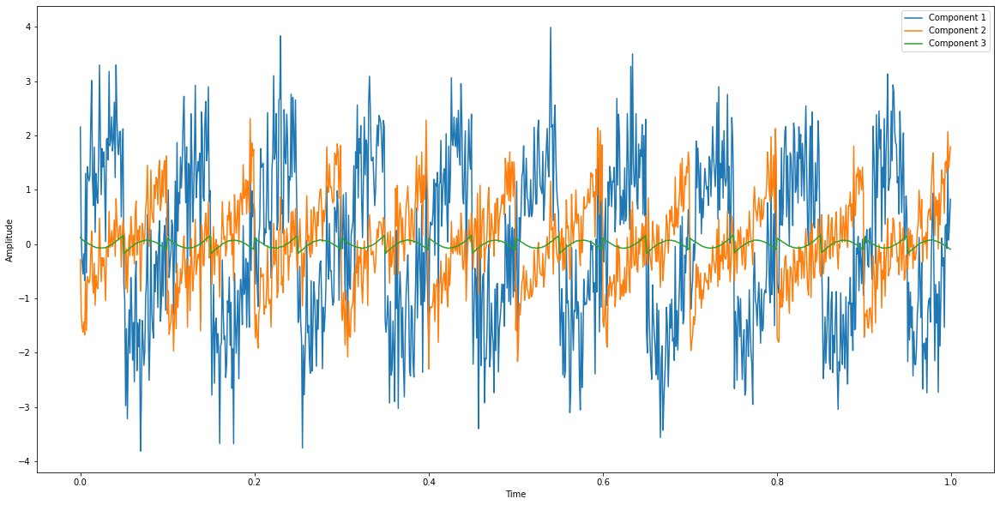

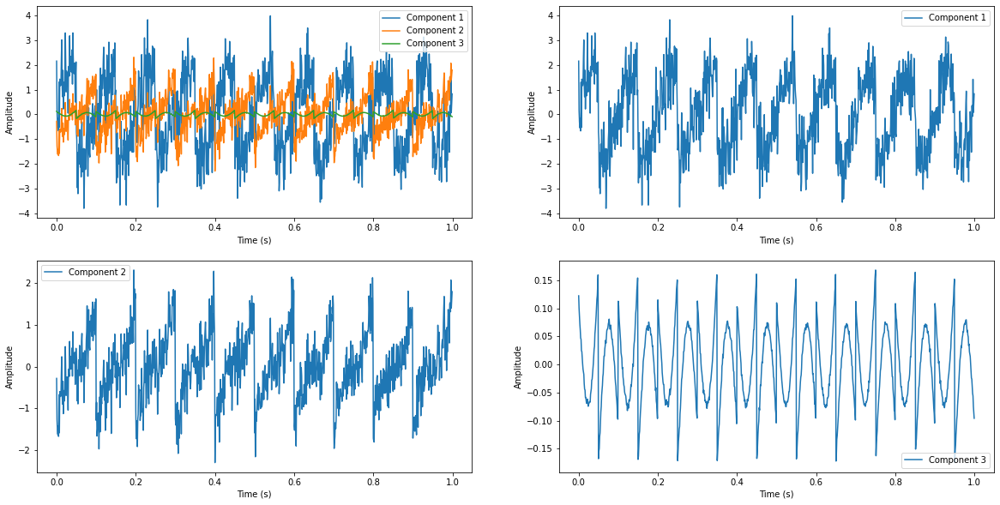

In [16]:
signals = np.column_stack([signal1, signal2, signal3])
Z, W = pca_using_covmat(signals)
plot_components(Z,t)
plot_components_separately(Z,t)

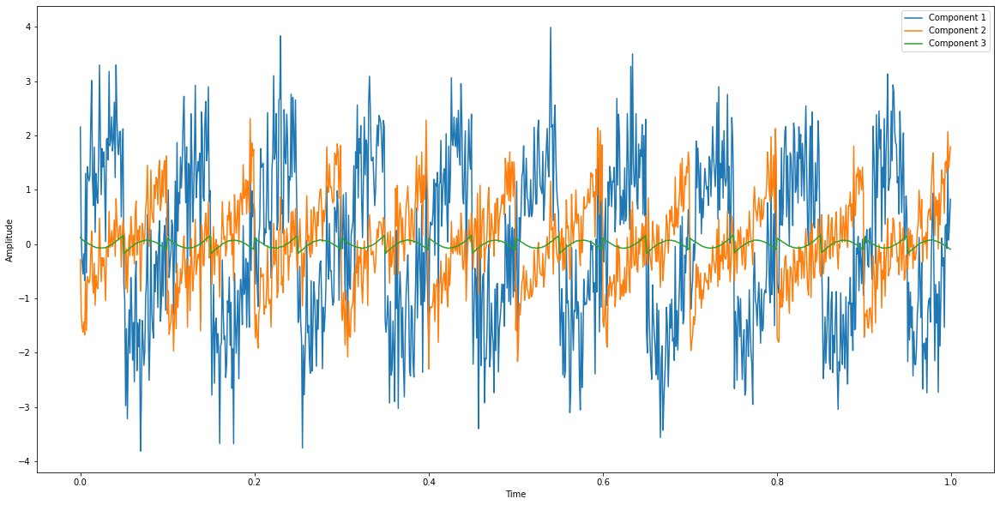

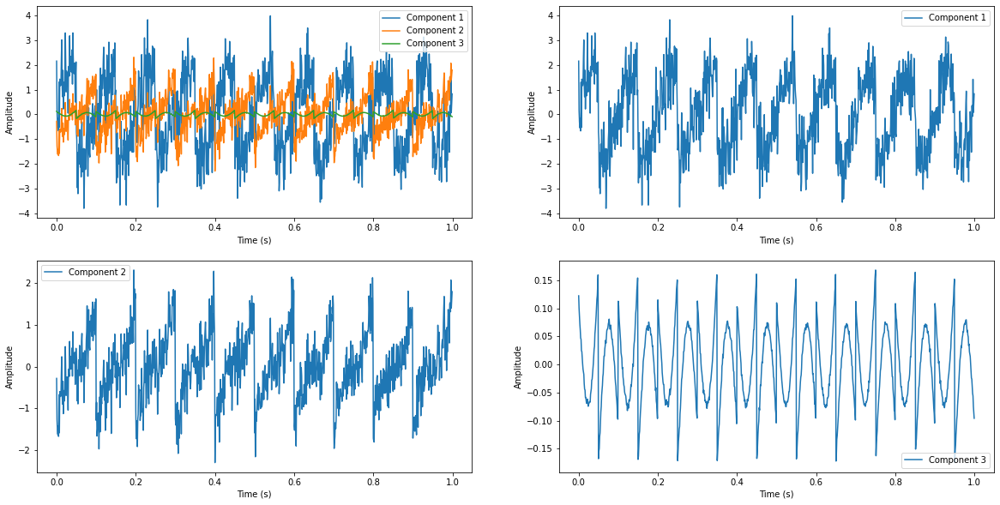

In [17]:
signals = np.column_stack([signal1, signal2, signal3])
Z, W = pca_using_svd(signals)
plot_components(Z,t)
plot_components_separately(Z,t)

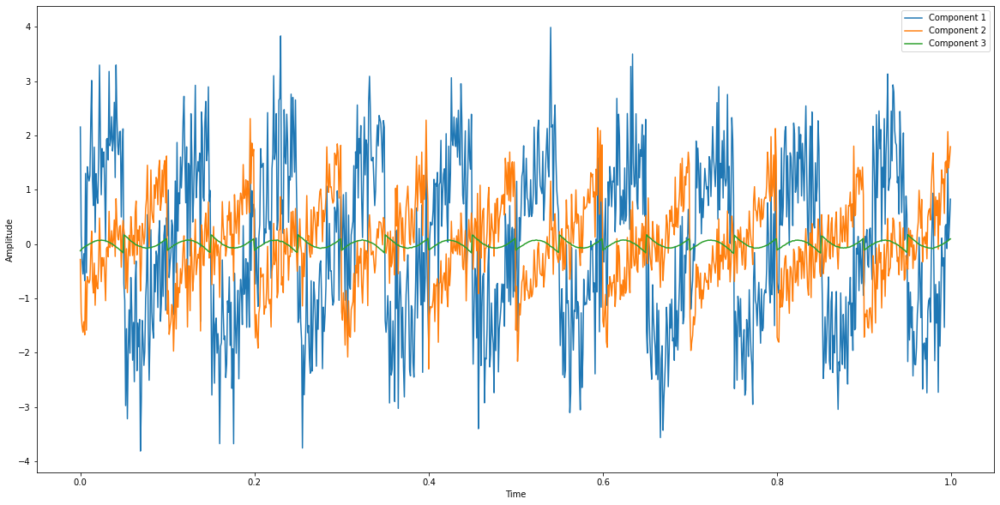

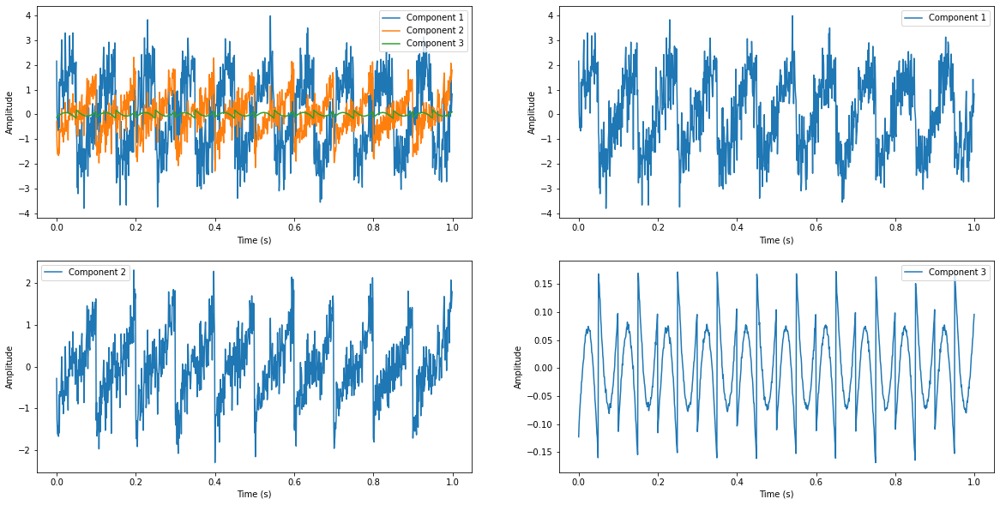

In [18]:
pca = PCA(n_components=3)
S_ = pca.fit_transform(np.array([signal1, signal2, signal3]).T)  # Reconstruct signals
A_ = pca.components_  # Get estimated mixing matrix

plot_components(S_,t)
plot_components_separately(S_,t)

#### Applying ICA on signals

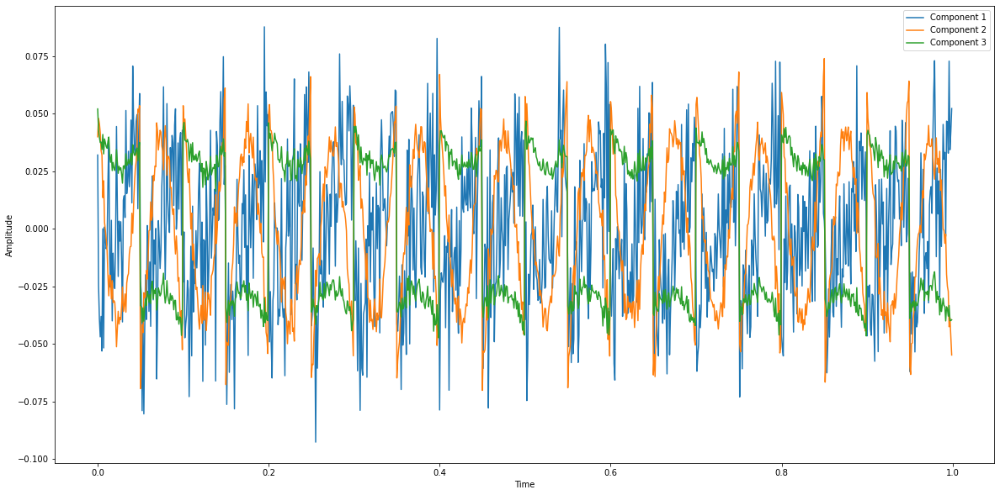

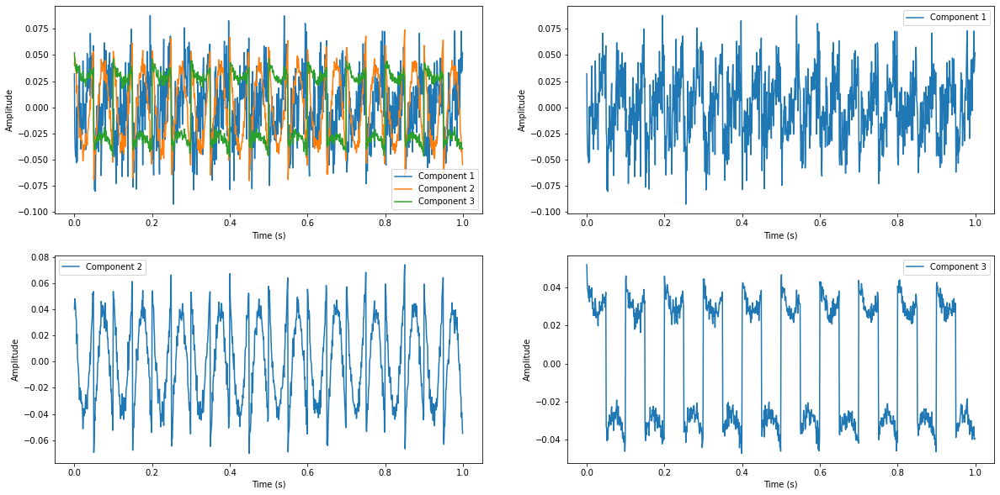

In [19]:
ica = FastICA(n_components=3)
S_ = ica.fit_transform(np.array([signal1, signal2, signal3]).T)  # Reconstruct signals
A_ = ica.mixing_  # Get estimated mixing matrix

plot_components(S_,t)
plot_components_separately(S_,t)

### For the mixture of these signals the PCA looks better than ICA. In PCA we can clearly distinguish sine wave, sawtooth wave and sqaure wave. This is because PCA works better with gaussian noise since it's a linear technique, while the ICA works better with non-gaussian noise since it's a non linear technique.. And also her the SNR is high so PCA is better than ICA since signal component is higher and data can be considered as gaussian.

# PART - B

This is a sample dataset provided by MNE. 
- In this experiment, checkerboard patterns were presented to the subject into the left and right visual field, interspersed by tones to the left or right ear. The interval between the stimuli was 750 ms. Occasionally a smiley face was presented at the center of the visual field. The subject was asked to press a key with the right index finger as soon as possible after the appearance of the face.
- EEG data from a 60-channel electrode cap was acquired simultaneously with the MEG
- For first part we are using only EEG data ( along with EOG and ECG channels recorded)
- The second part has code to work with MEG data

Link to the description - https://mne.tools/stable/overview/datasets_index.html#sample

In [20]:
from mne.datasets import sample
data_path = sample.data_path()
raw_fname = str(data_path) + '/MEG/sample/sample_audvis_filt-0-40_raw.fif'
raw = mne.io.Raw(raw_fname)
raw.info

Opening raw data file C:\Users\91626\mne_data\MNE-sample-data/MEG/sample/sample_audvis_filt-0-40_raw.fif...
    Read a total of 4 projection items:
        PCA-v1 (1 x 102)  idle
        PCA-v2 (1 x 102)  idle
        PCA-v3 (1 x 102)  idle
        Average EEG reference (1 x 60)  idle
    Range : 6450 ... 48149 =     42.956 ...   320.665 secs
Ready.


<Info | 15 non-empty values
 bads: 2 items (MEG 2443, EEG 053)
 ch_names: MEG 0113, MEG 0112, MEG 0111, MEG 0122, MEG 0123, MEG 0121, MEG ...
 chs: 204 Gradiometers, 102 Magnetometers, 9 Stimulus, 60 EEG, 1 EOG
 custom_ref_applied: False
 dev_head_t: MEG device -> head transform
 dig: 146 items (3 Cardinal, 4 HPI, 61 EEG, 78 Extra)
 file_id: 4 items (dict)
 highpass: 0.1 Hz
 hpi_meas: 1 item (list)
 hpi_results: 1 item (list)
 lowpass: 40.0 Hz
 meas_date: 2002-12-03 19:01:10 UTC
 meas_id: 4 items (dict)
 nchan: 376
 projs: PCA-v1: off, PCA-v2: off, PCA-v3: off, Average EEG reference: off
 sfreq: 150.2 Hz
>

# EEG

---


# **Plot the RAW data and view**  (EDITME)
Change the duration and the number of channels and browse through the data

Removing projector <Projection | PCA-v1, active : False, n_channels : 102>
Removing projector <Projection | PCA-v2, active : False, n_channels : 102>
Removing projector <Projection | PCA-v3, active : False, n_channels : 102>


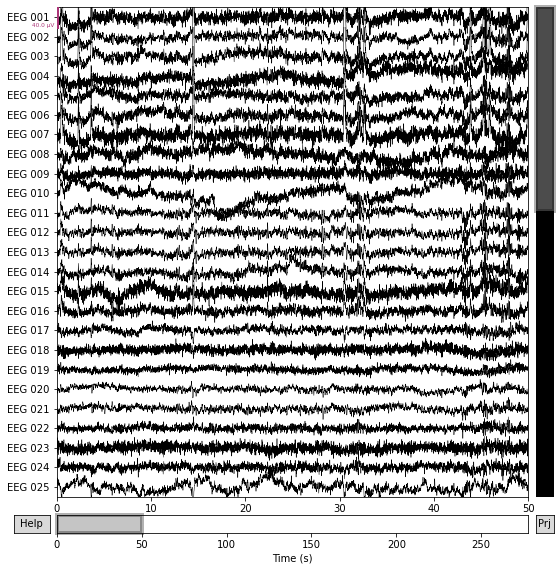

In [41]:
raw_eeg = raw.copy()
raw_eeg.pick_types(meg=False, eeg=True, eog=True, ecg=True) # Selecting EEG, EOG and ECG channels <======
x = raw_eeg.plot(duration=50,n_channels=25) # Tweak duration & number of channels <======



---


# Run ICA  - plot components and browse
Try to edit the number of components and re-run the ICA

- https://mne.tools/stable/generated/mne.preprocessing.ICA.html

In [42]:
ica_eeg = ICA(n_components=20, random_state=97) #Setup ICA <=======
ica_eeg.fit(raw_eeg) # Run ICA

Fitting ICA to data using 59 channels (please be patient, this may take a while)
Selecting by number: 20 components
Fitting ICA took 2.3s.


Method,fastica
Fit,70 iterations on raw data (41700 samples)
ICA components,20
Available PCA components,59
Channel types,eeg
ICA components marked for exclusion,—


Creating RawArray with float64 data, n_channels=21, n_times=41700
    Range : 6450 ... 48149 =     42.956 ...   320.665 secs
Ready.


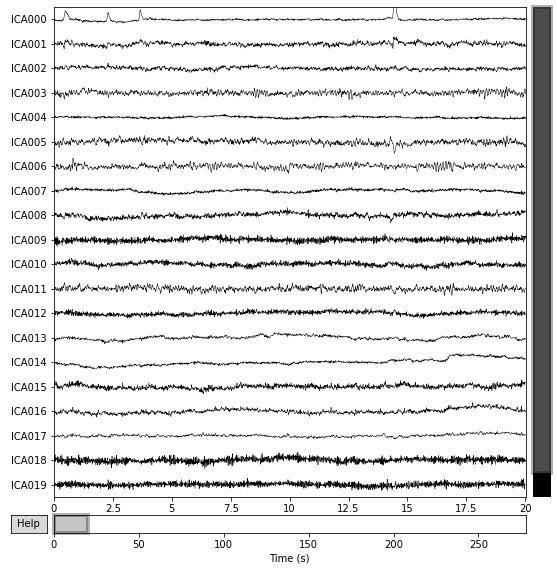

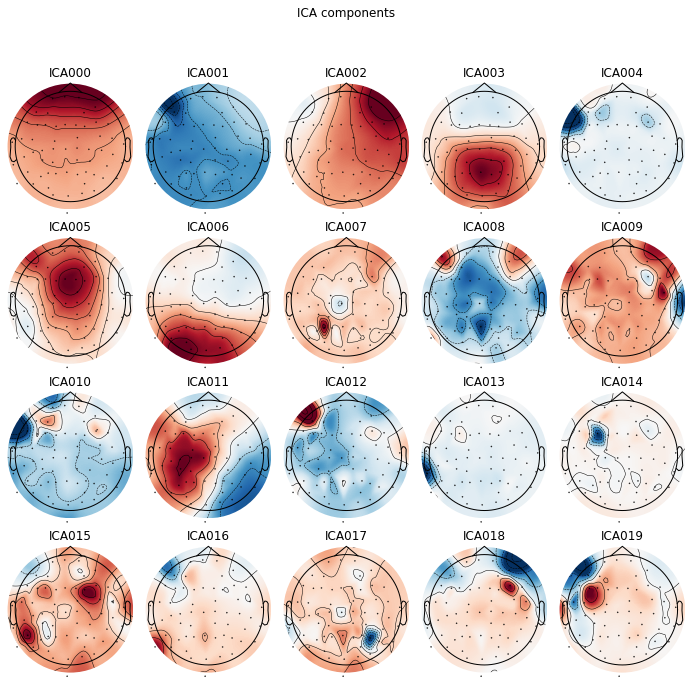

In [43]:
x = ica_eeg.plot_sources(raw_eeg) # Plot time series
x = ica_eeg.plot_components() #Plot topographies

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
138 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
138 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
138 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
138 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
138 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
138 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
138 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
138 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
138 matching events found
No baseline correction applied
0 pro

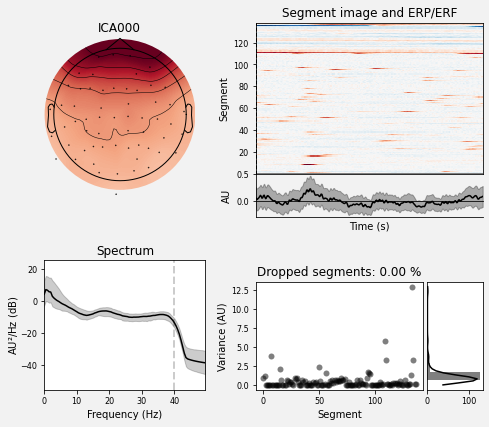

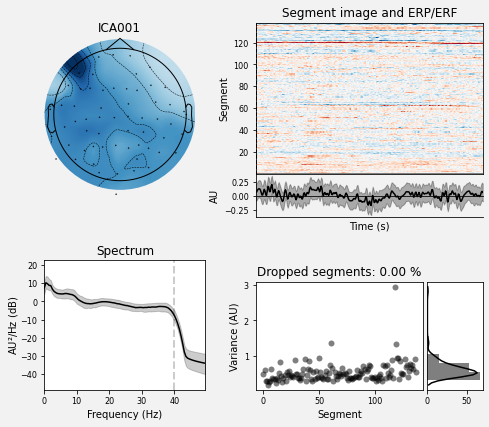

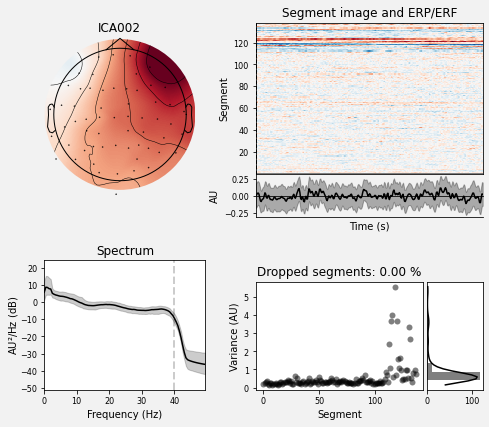

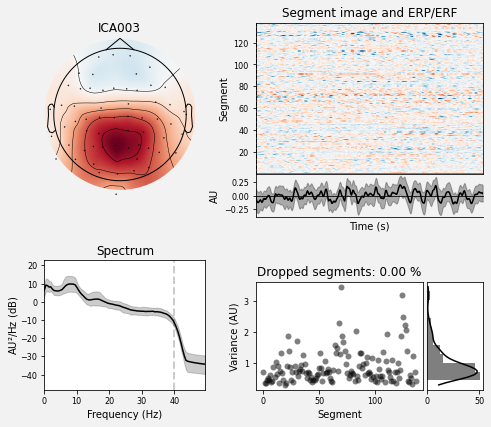

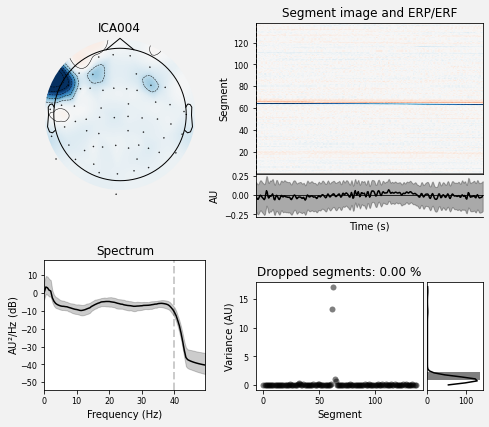

...

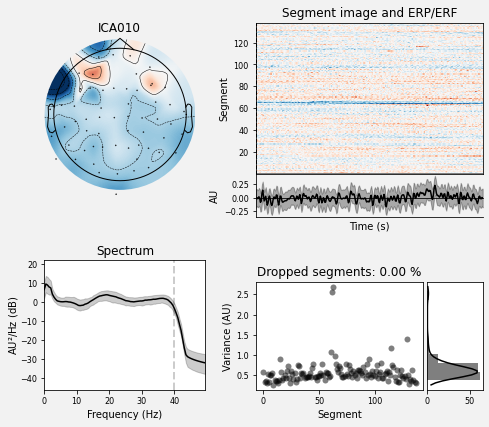

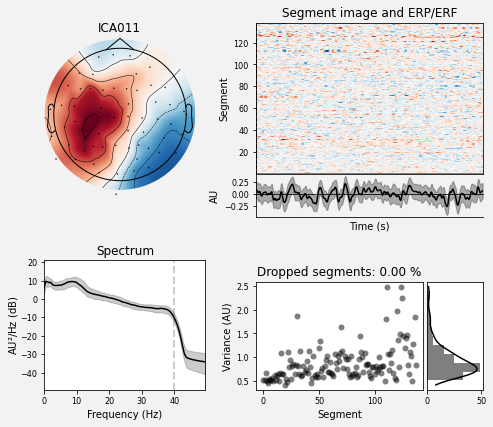

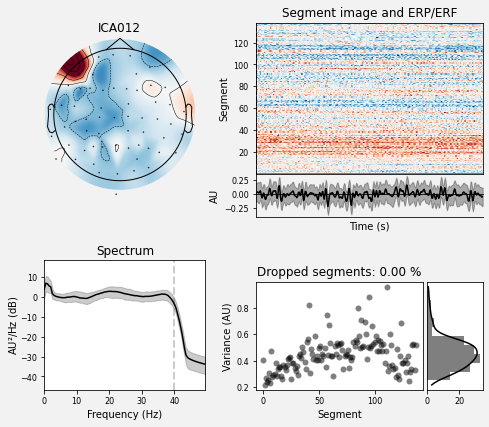

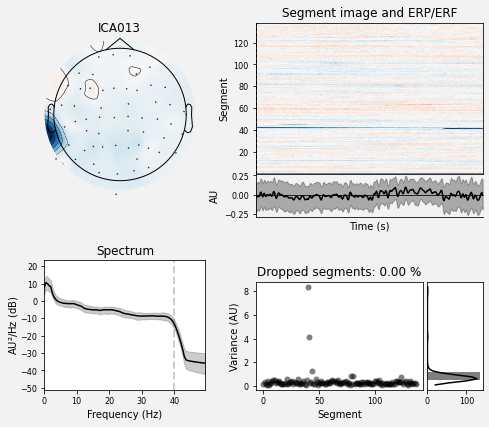

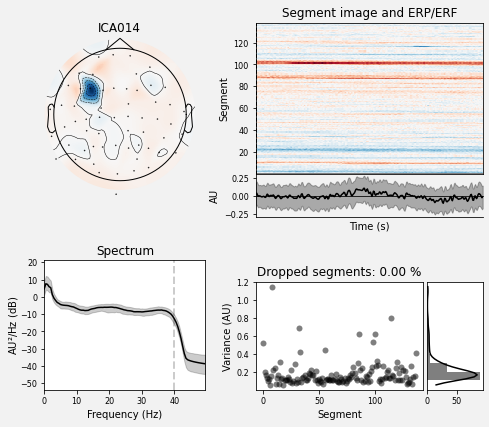

[<Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>]

In [44]:
# plot power spectrum of components
ica_eeg.plot_properties(raw_eeg, picks=range(15))

### Visualize the ICs as topographical plots AND time-series plots - can you spot the ECG and EOG artefactual components?

We can spot the ECG and EOG artefacts in the topographical plots, taking the help of time series, power spectrum and variance it becomes much more easy to confirm that the given component is and artefact. We can see that ICA000 is clearly and EOG artefact since it has sudden spikes due to blinking of eye. In the topographical plot we can see that the potential towards eye is high( positive ) while it decreases while going to occipital lobe showing that eyes activity can be considered as an equivalent electric dipole having positive side towards cornea and negative towards. For EOG artifact the power spectra amplitude is high for frequency around 5Hz and after that it decreases.

Similarly, for ECG we can spot the QRS complex kind of component in the time series plot. Also in topographical plot the potential is high in pre-central gyrus and variation is high for this. The power spectra amplitude is high for less than 4Hz frequency. By observing this we can conclude that ICA005 is due to ECG artefact.

Apart from this we can observe the 60Hz noise component in the ICA009, ICA010, ICA018 and ICA019 that is also an artifact. Sometimes that can also be due to the muscle activity.

# Drop artefactual components (EDITME)

Applying ICA to Raw instance
    Transforming to ICA space (20 components)
    Zeroing out 8 ICA components
    Projecting back using 59 PCA components


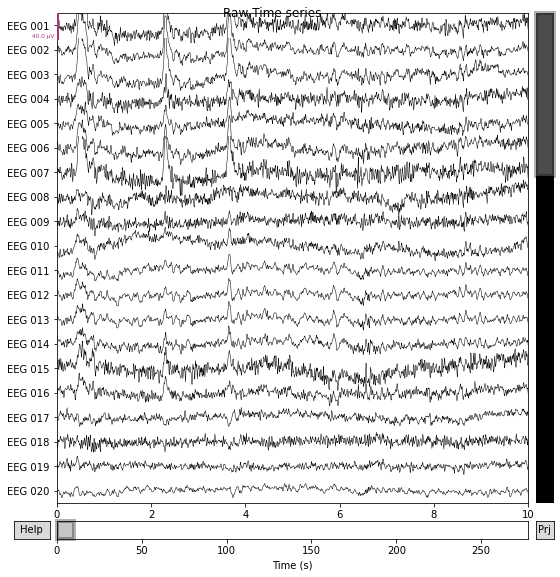

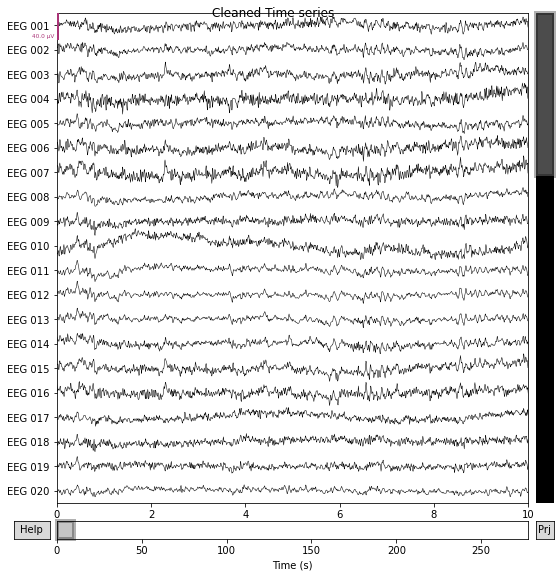

In [53]:
raw_eeg.load_data()

ica_eeg.exclude = [0,4,5,7,9,10,18,19]  # indices chosen based on various plots above <======

# ica.apply() changes the Raw object in-place, so let's make a copy first:
reconst_raw = raw_eeg.copy()
ica_eeg.apply(reconst_raw)

#Raw
raw_eeg.plot(show=False)
plt.suptitle('Raw Time series')


#Reconstruced after removing artefactual components
reconst_raw.plot(show=False)
plt.suptitle('Cleaned Time series')
plt.show()

# raw_eeg.plot_psd(fmax=40)
# reconst_raw.plot_psd(fmax=40)
# plt.show()

# del reconst_raw


### Remove the possible artefactual components and replot the data and see if the ECG/EOG artefacts are removed. Did it work? 

It worked but still there is some noise and unwanted signal present.

#### Perhaps add a few more components if it didn’t?

After adding few more component like ICA004 and ICA007 it is completely fine. Those two component looks more like a flat line so most probably they have some spikes in the coming time that can be seen from their ERP plot and topographical plot(since it looks like a concentrated dipole confined to a small space).

#### Reduce the dropped components and see if the artefacts stay removed or if they come back onto the signal?
By reducing any of the above dropped components, the artefacts are coming back that implies that the dropped components contains artefact. It may be possible that those components also contain some amount of signal that is lost now. 


# MEG 
---  
# **Plot the RAW data and view**  
Change the duration and the number of channels and browse through the data

Removing projector <Projection | Average EEG reference, active : False, n_channels : 60>


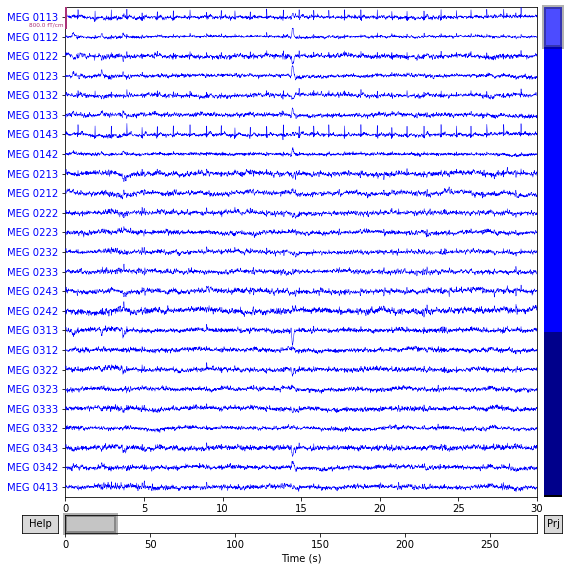

In [54]:
raw_meg = raw.copy()
raw_meg.pick_types(meg=True, eeg=False, eog=True, ecg=True) # Selecting MEG, EOG and ECG channels <======
x = raw_meg.plot(duration=30,n_channels=25) # Tweak duration & number of channels <======

In [55]:
ica_meg = ICA(n_components=20, random_state=97) #Setup ICA <=======
ica_meg.fit(raw_meg) # Run ICA

Fitting ICA to data using 305 channels (please be patient, this may take a while)
Selecting by number: 20 components
Fitting ICA took 3.4s.


Method,fastica
Fit,56 iterations on raw data (41700 samples)
ICA components,20
Available PCA components,305
Channel types,"mag, grad"
ICA components marked for exclusion,—


Creating RawArray with float64 data, n_channels=21, n_times=41700
    Range : 6450 ... 48149 =     42.956 ...   320.665 secs
Ready.


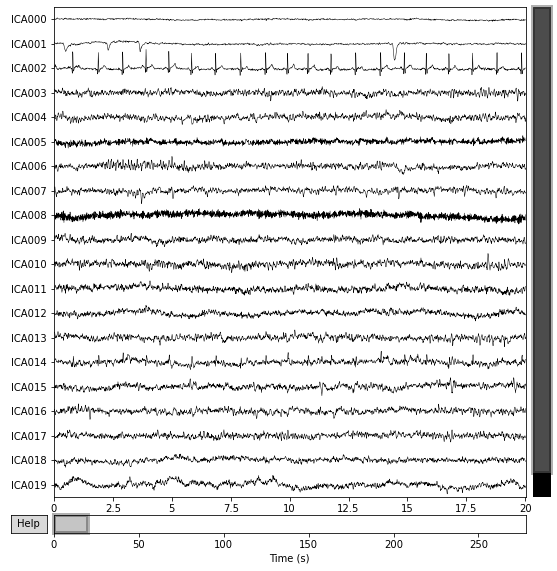

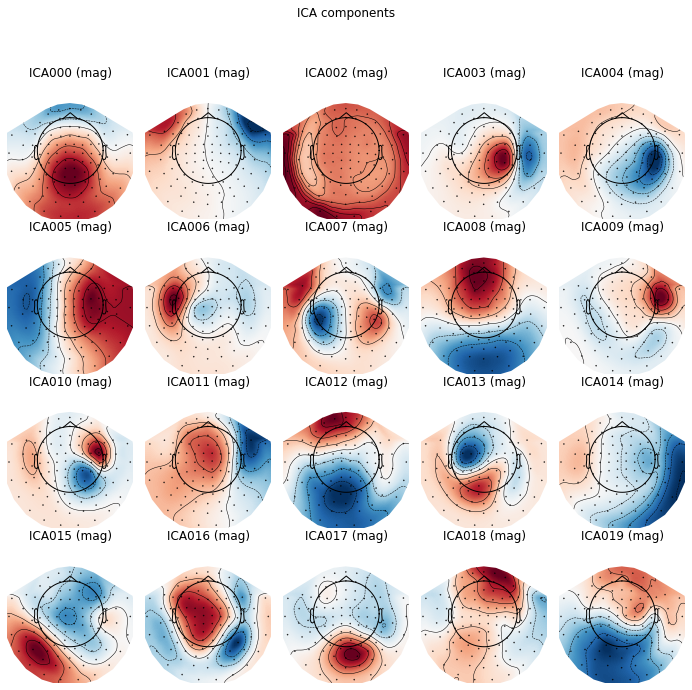

In [56]:
x = ica_meg.plot_sources(raw_meg) # Plot time series
x = ica_meg.plot_components() #Plot topographies

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
138 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
138 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
138 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
138 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
138 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
138 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
138 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
138 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
138 matching events found
No baseline correction applied
0 pro

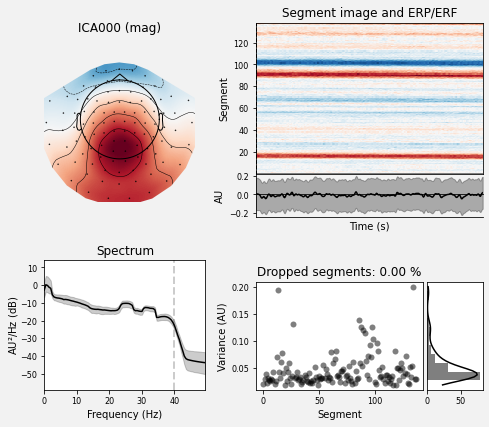

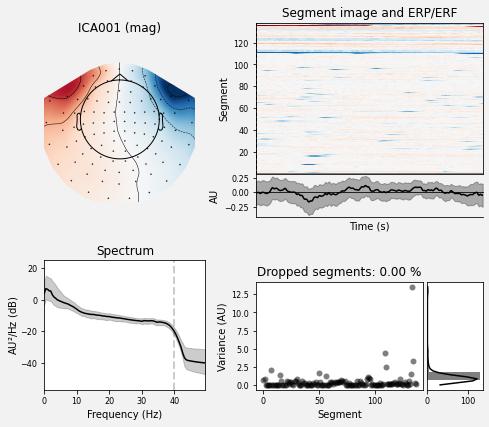

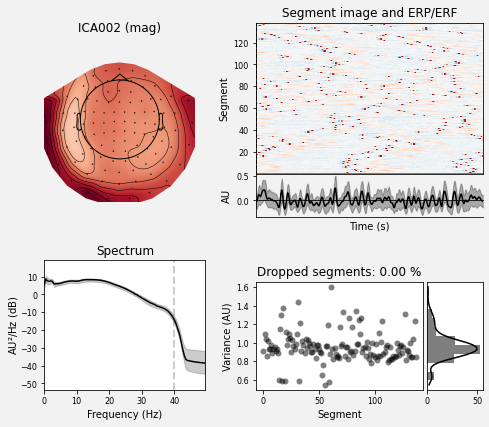

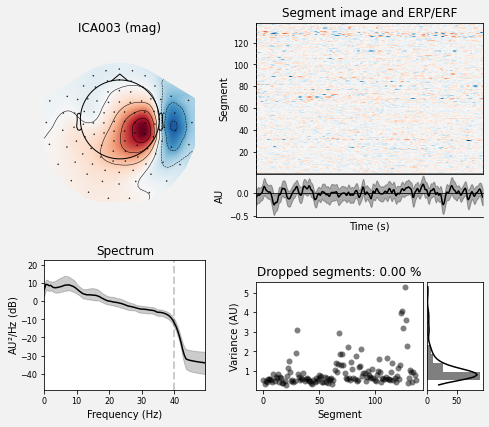

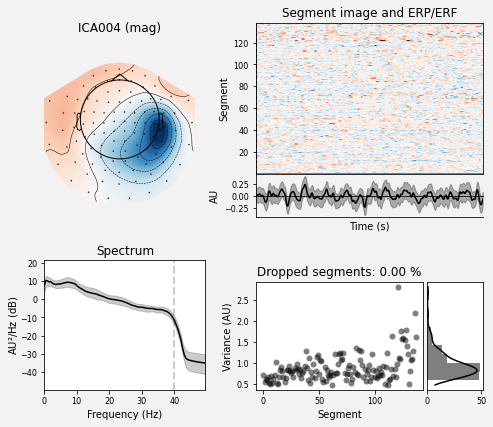

...

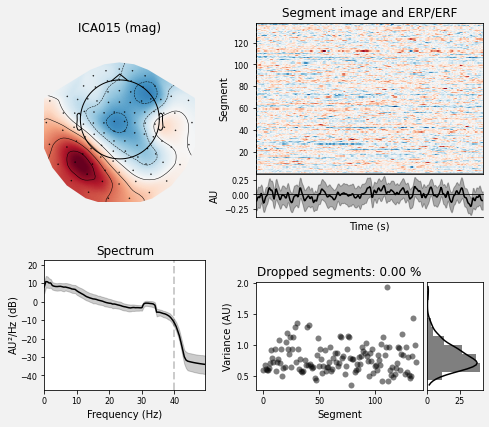

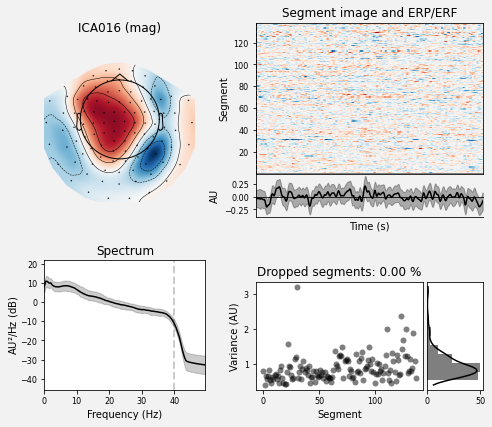

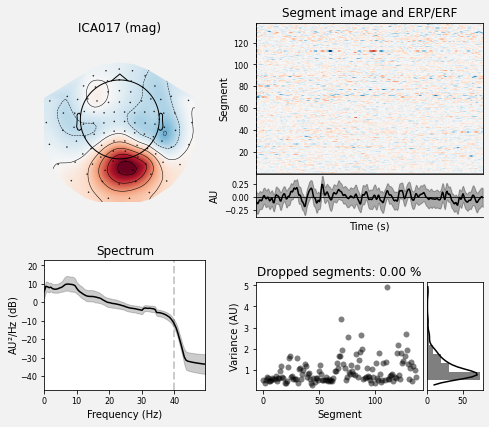

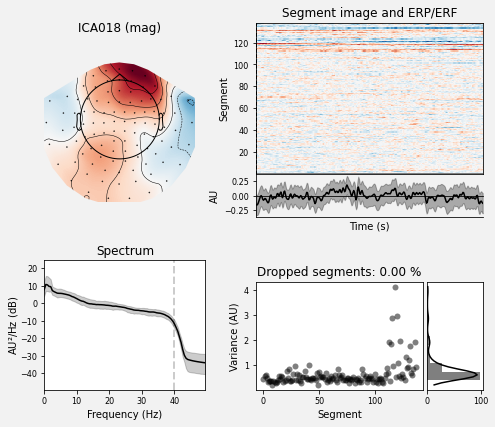

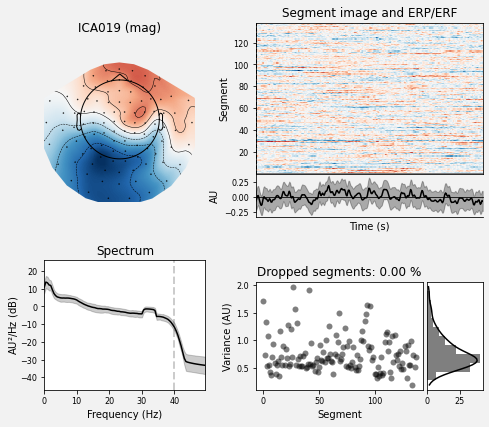

[<Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>,
 <Figure size 504x432 with 6 Axes>]

In [57]:
ica_meg.plot_properties(raw_meg, picks=range(20))

Applying ICA to Raw instance
    Transforming to ICA space (20 components)
    Zeroing out 5 ICA components
    Projecting back using 305 PCA components


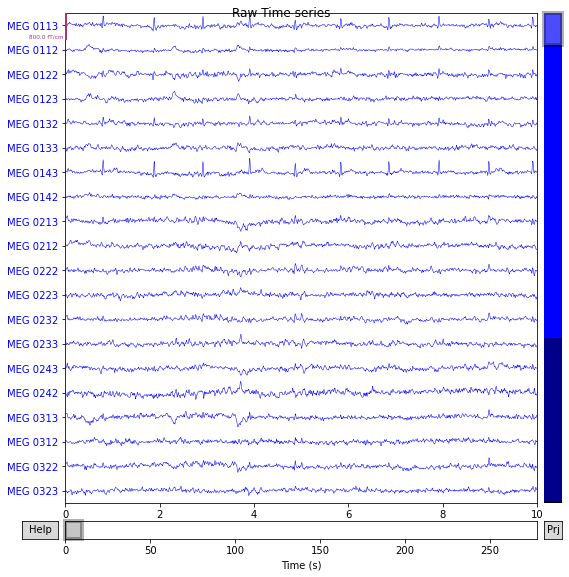

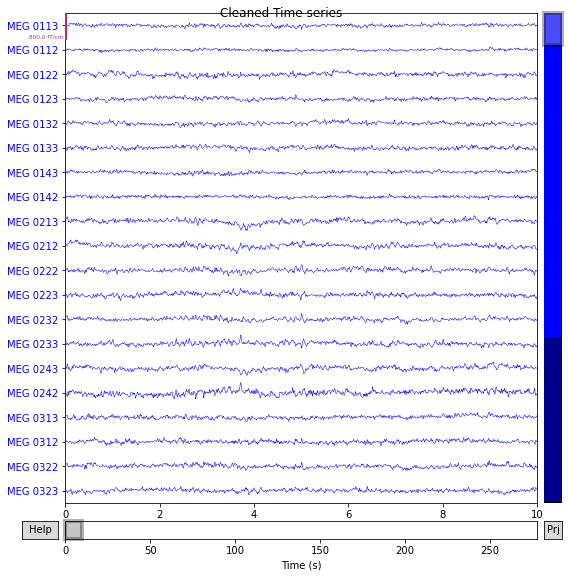

In [60]:
raw_meg.load_data()

ica_meg.exclude = [1,2,5,8,19]  # indices chosen based on various plots above <======

# ica.apply() changes the Raw object in-place, so let's make a copy first:
reconst_raw = raw_meg.copy()
ica_meg.apply(reconst_raw)

#Raw
raw_meg.plot(show=False)
plt.suptitle('Raw Time series')


#Reconstruced after removing artefactual components
reconst_raw.plot(show=False)
plt.suptitle('Cleaned Time series')
plt.show()
del reconst_raw

##### Here ICA001, ICA002 looks like EOG artefact, ICA005 an ECG artefact and ICA008 and ICA019 are due to muscle activity. After removing all these we get a clear time series signal for MEG.

#### Was there a difference in the ECG and EOG artefacts in MEG vs EEG? Explain what you observe in this respect?
In EEG, ECG and EOG artifacts are much easier to detect due to strong electrical signal generated during heart activity and blinking of eye respectively. While in case of MEG, these artifacts are weaker and hard to identify.

### How should the dipoles be positioned to create such topographies in EEG? 
For ECG, we can place a dipole in the deep structure of brain in the same direction as the dominant vector of ECG, and provide a very low amplitude souce. In can of EOG, we can place a dipole positive side on cornea and negative side on retina, with a high amplitude source

# Optional

### What happens if you change the n_components or the number of ICA components to be decomposed?
If we change the n_components, the number of independent components we get will change. If we increase it to much we might get noise as a component. While if we decrease it too much we may loose some of the information.

### Does it still work well without the reference ECG/EOG channels added along with the EEG data during ICA separation?
If we remove these references we will lose the accuracy and it will be difficult to remove the ECG and EOG artefacts. This is because these reference channels provide additional information to the ICA algorithm which can be better used to identify artifacts.

### How does MNE-Python actually perform ICA? What are the different steps? Is PCA a part of it?
MNE-Python performs ICA in the following steps:
1. Data pre-processing

2. PCA - to decorrelate the data and reduce dimentionality

3. ICA algorithm - it uses FastICA to separate signals into independent compoents by maximizing the non-gaussianity of each component. 

4. Selection of Components - independent components are ranked based on various factors.

5. Unmixing Matrix: The unmixing matrix is then computed to reconstruct the independent components back into the original signal space.

##### So we can see that PCA is a part of mne-python ICA

### With this topography in mind, can you now go back to the BESA simulator and simulate dipole position and directions that could create similar topographies in an EEG?
Yeah, we can model each of these as an equivalent electric dipole. 

For EOG as described, dipole can be placed near the eye with positive side towards cornea and negative towards the retina. And we can give a high amplitude source with a low frequency around 5Hz.

For ECG, dipole can be placed deep into the brain going from right to the left in a slant position. We can give a very low amplitude to the source and low frequency.